(Bayesian Vector Autoregressive Models)=
# Bayesian Vector Autoregressive Models

:::{post} Oct, 2022
:tags: time series, VARs 
:category: intermediate
:author: Ricardo Vieira, Nathaniel Forde
:::

In [1091]:
import arviz as az
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import statsmodels.api as sm
import aesara as at
from statsmodels.tsa.api import VAR

In [2]:
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)
az.style.use("arviz-darkgrid")
%config InlineBackend.figure_format = 'retina'

# Bayesian Hierarchical GDP

In this notebook we will outline an application of the Bayesian Vector Autoregressive Modelling. We will draw on the work in the PYMC Labs blogpost. This will be a three part series. In the first we want to show how to fit a simple Bayesian VAR model in PYMC. In the second we will show how to extract extra insight from the fitted model with Impulse Response analysis and make forecasts from the fitted VAR model. In the third and final post we will show the benefits of using hierarchical priors with Bayesian VAR models.

In this post we will (i) demonstrate the basic pattern on a simple VAR model on fake data and show how the model recovers the true data generating parameters and (ii) we will show an example applied to macro-economic data and compare the results to those achieved on the same data with statsmodels MLE fits.  


In [508]:
def simulate_var(intercepts, coefs_yy, coefs_xy, coefs_xx, coefs_yx, noises=(1, 1), *, warmup=100, steps=200):
    draws_y = np.zeros(warmup+steps)
    draws_x = np.zeros(warmup+steps)
    draws_y[:2] = intercepts[0]
    draws_x[:2] = intercepts[1]
    for step in range(2, warmup+steps):
        draws_y[step] = (
            intercepts[0]
            + coefs_yy[0] * draws_y[step-1]
            + coefs_yy[1] * draws_y[step-2]
            + coefs_xy[0] * draws_x[step-1]
            + coefs_xy[1] * draws_x[step-2]
            + rng.normal(0, noises[0])
        )
        draws_x[step] = (
            intercepts[1]
            + coefs_xx[0] * draws_x[step-1]
            + coefs_xx[1] * draws_x[step-2]
            + coefs_yx[0] * draws_y[step-1]
            + coefs_yx[1] * draws_y[step-2]
            + rng.normal(0, noises[1])
        )
    return draws_y[warmup:], draws_x[warmup:]

## Generate Fake VAR data

First we generate some fake data with known parameters. 

In [517]:
var_y, var_x = simulate_var(
    intercepts=(18, 8),
    coefs_yy=(-0.8, 0),
    coefs_xy=(0.9, 0),
    coefs_xx=(1.3, -0.7),
    coefs_yx=(-0.1, 0.3),
)

df = pd.DataFrame({'x': var_x, 'y': var_y})
df

,x,y
0,35.755567,28.523621
1,35.284106,27.725480
2,34.349966,29.475989
3,33.179609,23.655624
4,34.517479,29.556294
...,...,...
195,34.023520,26.104873
196,34.248960,28.330898
197,34.286002,26.162559
198,32.559745,27.093902


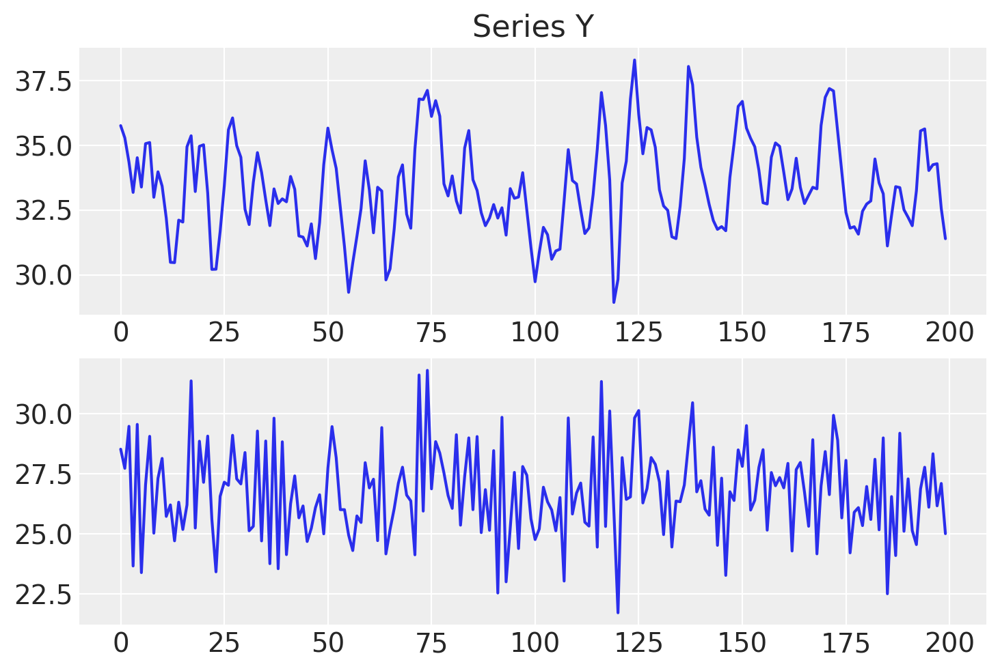

In [974]:
fig, axs = plt.subplots(2, 1)
axs[0].plot(df['x'], label='x')
axs[0].set_title("Series X")
axs[1].plot(df['y'], label='y')
axs[0].set_title("Series Y");

## Handling Multiple Lags and Different Dimensions

When Modelling multiple timeseries and accounting for potentially any number lags to incorporate in our model we need to abstract some of the model defintion to helper functions. An example will make this a bit clearer. 


In [1077]:

### Define a helper function that will construct our beta matrix for the marginal contribution of each lagged
### term in each of the respective time series equations
def calc_ar_step(lag_coefs, n_eqs, n_lags, df):
    ars = []
    for j in range(n_eqs) :
        ar = pm.math.sum([
            pm.math.sum(lag_coefs[j, i] * df.values[n_lags-(i+1): -(i+1)], axis=-1)
            for i in range(n_lags)
        ], axis=0)
    ars.append(ar)
    beta = pm.math.stack(ars, axis=-1)

    return beta

### Make the model in such a way that it can handle different specifications of the likelihood term
### and can be run for simple prior predictive checks. This latter functionality is important for debugging of
### shape handling issues. Building a VAR model involves quite a few moving parts and it is handy to
### inspect the shape implied in the prior predictive checks. 
def make_model(n_lags, n_eqs, df, mv_norm=True, prior_checks=True):
    coords={"lags": np.arange(n_lags) + 1,
            "equations": df.columns.tolist(),
            "cross_vars": df.columns.tolist(),
            "time": [x for x in df.index[n_lags:]]}

    with pm.Model(coords=coords) as model:
        lag_coefs = pm.Normal("lag_coefs", mu=0, sigma=1, dims=["equations", "lags", "cross_vars"]) #filters x rows x columns
        alpha = pm.Normal("alpha", mu=10, sigma=5, dims=("equations",))
        data_obs = pm.Data('data_obs', df.values[n_lags:], dims=['time', 'equations'], mutable=True)

        betaX = calc_ar_step(lag_coefs, n_eqs, n_lags, df)
        betaX = pm.Deterministic('betaX', betaX)
        mean = alpha + betaX

        if mv_norm:
            n = df.shape[1]
            ## Under the hood the LKJ prior will retain the correlation matrix too.
            noise_chol, _, _ = pm.LKJCholeskyCov('noise_chol', eta=1.0, n=n, sd_dist=pm.HalfNormal.dist(sigma=1))
            obs = pm.MvNormal("obs", mu=mean, chol=noise_chol, observed=data_obs)
        else:
            ## This is an alternative likelihood that can recover sensible estimates of the coefficients
            ## But lacks the multivariate correlation which between the timeseries.
            sigma = pm.HalfNormal('noise', sigma=1.0, dims=['equations'])
            obs = pm.Normal('obs', mu=mean, sigma=sigma, observed=data_obs)
                
        if prior_checks:
            idata = pm.sample_prior_predictive()
            return model, idata
        else: 
            idata = pm.sample_prior_predictive()
            idata.extend(pm.sample())
            pm.sample_posterior_predictive(idata, extend_inferencedata=True, random_seed=rng)
    return model, idata


    

We will inspect the structure of a VAR with 2 lags and 2 equations

Sampling: [alpha, lag_coefs, noise_chol, obs]


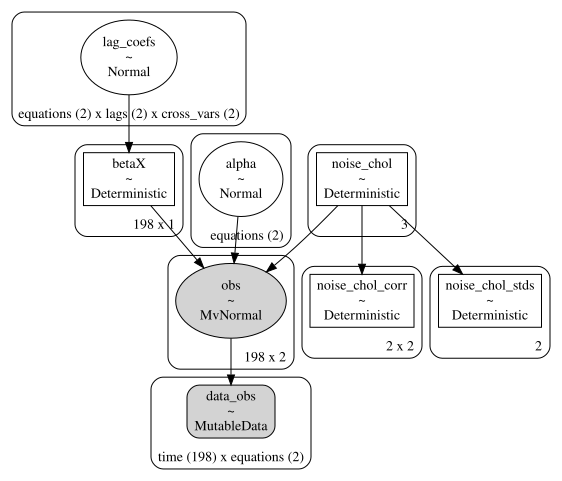

In [1078]:
n_lags = 2
n_eqs = 2
model, idata = make_model(n_lags, n_eqs, df)
pm.model_to_graphviz(model)

Another VAR with 3 lags and 2 equations. 

Sampling: [alpha, lag_coefs, noise_chol, obs]


  lag_coefs: shape=(2, 3, 2)
      alpha: shape=(2,)
noise_chol_cholesky-cov-packed__: shape=(3,)
 noise_chol: shape=(3,)


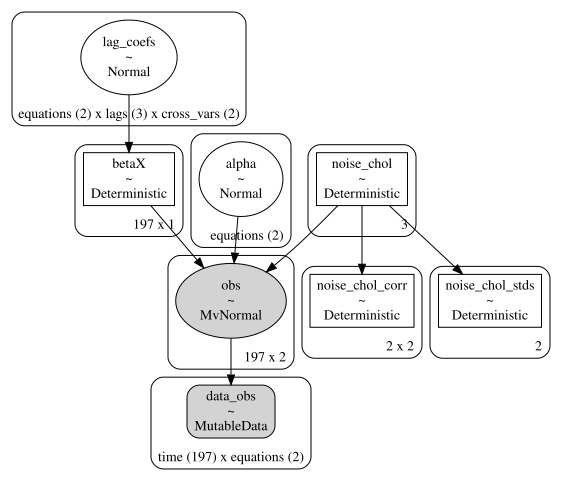

In [1079]:
n_lags = 3
n_eqs = 2
model, idata = make_model(n_lags, n_eqs, df)
for rv, shape in model.eval_rv_shapes().items():
    print(f"{rv:>11}: shape={shape}")
pm.model_to_graphviz(model)

We can inspect the correlation matrix between our timeseries which is implied by the prior specification. 

/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_73226/1477910989.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  prior_corr = (idata['prior']['noise_chol_corr'].to_dataframe().reset_index()
/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_73226/1477910989.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  prior_corr = (idata['prior']['noise_chol_corr'].to_dataframe().reset_index()


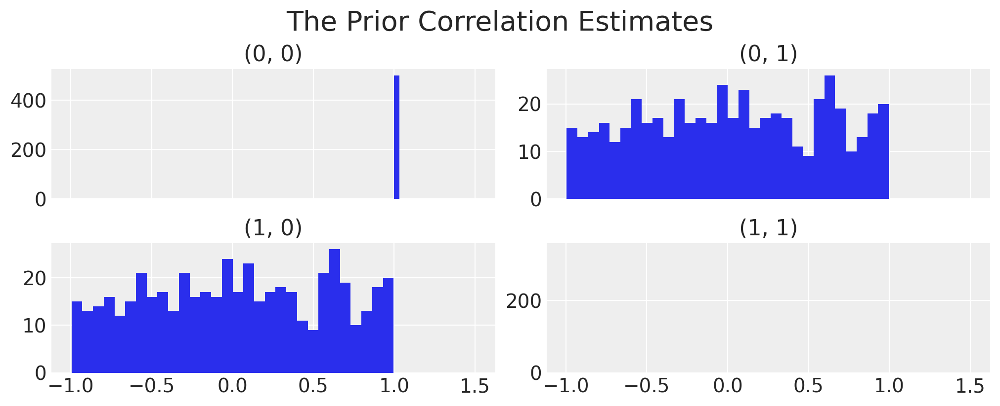

In [1074]:
prior_corr = (idata['prior']['noise_chol_corr'].to_dataframe().reset_index()
.pivot(['chain', 'draw', 'noise_chol_corr_dim_0'], 'noise_chol_corr_dim_1', 'noise_chol_corr').reset_index()
.pivot(['chain', 'draw'], 'noise_chol_corr_dim_0'));
prior_corr.columns = prior_corr.columns.to_flat_index()
fig, axs = plt.subplots(2, 2, figsize=(10, 4), sharex=True)
axs = axs.flatten()
for ax, col in zip(axs, prior_corr.columns):
    ax.hist(prior_corr[col], bins=30)
    ax.set_title(col)
plt.suptitle("The Prior Correlation Estimates", fontsize=20);

Now we will fit the VAR with 2 lags and 2 equations

In [1057]:
n_lags = 2
n_eqs = 2
model, idata_fake_data = make_model(n_lags, n_eqs, df, prior_checks=False)


Sampling: [alpha, lag_coefs, noise_chol, obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lag_coefs, alpha, noise_chol]
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 667 seconds.
Sampling: [obs]


In [1060]:
az.summary(idata_fake_data, var_names=['alpha', 'lag_coefs', 'noise_chol_corr'])

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[x],16.961,1.272,14.643,19.425,0.031,0.022,1733.0,1940.0,1.0
alpha[y],10.279,1.276,7.808,12.605,0.031,0.022,1737.0,1947.0,1.0
"lag_coefs[x, 1, x]",0.005,0.987,-1.817,1.897,0.015,0.017,4307.0,2518.0,1.0
"lag_coefs[x, 1, y]",-0.005,1.001,-1.870,1.850,0.016,0.017,4128.0,2621.0,1.0
"lag_coefs[x, 2, x]",-0.002,0.997,-1.934,1.806,0.015,0.017,4568.0,2917.0,1.0
"lag_coefs[x, 2, y]",-0.012,1.032,-1.859,2.018,0.015,0.017,4669.0,2814.0,1.0
"lag_coefs[y, 1, x]",1.170,0.046,1.078,1.249,0.001,0.001,2949.0,2486.0,1.0
"lag_coefs[y, 1, y]",-0.468,0.048,-0.558,-0.377,0.001,0.001,2023.0,2508.0,1.0
"lag_coefs[y, 2, x]",-0.408,0.070,-0.540,-0.277,0.002,0.001,2035.0,2553.0,1.0
"lag_coefs[y, 2, y]",0.130,0.050,0.029,0.218,0.001,0.001,1753.0,2391.0,1.0


We can see here how the modelling has recovered the broadly correct relationships between the two series. The impact of x's first lag on y is a little higher than in the actual case, but the alpha parameters are basically correct. To visualise this a little more clearly we can examine the posterior predictive checks to see how this system can replicate the observed data. 

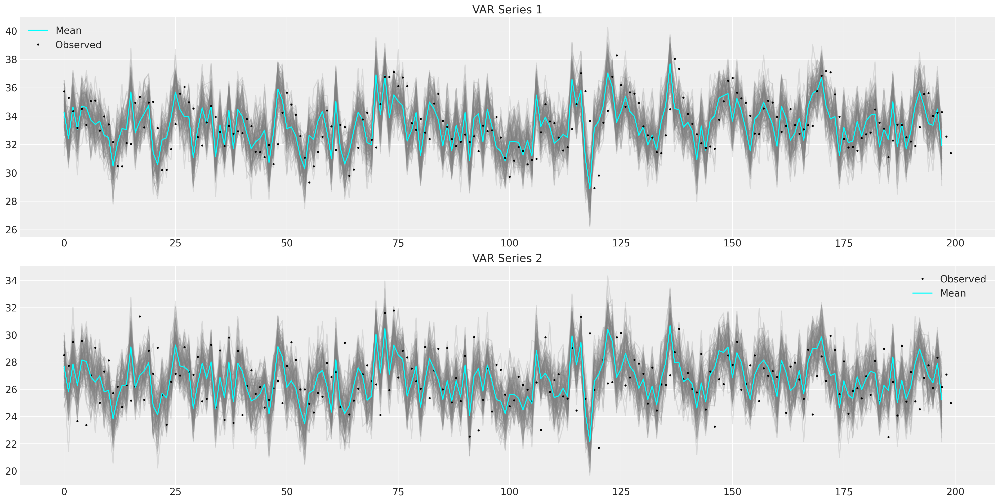

In [1061]:
def plot_ppc(idata, df, group='posterior_predictive'):
    fig, axs = plt.subplots(2, 1, figsize=(20, 10))
    axs = axs.flatten()
    ppc = az.extract_dataset(idata, group=group, num_samples=100)["obs"]

    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color='grey', alpha=0.2);
    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color='cyan', label='Mean');
    axs[0].plot(df['x'], 'o', color='black', markersize=2, label='Observed')
    axs[0].set_title("VAR Series 1")
    axs[0].legend()
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color='grey', alpha=0.2);
    axs[1].plot(df['y'], 'o', color='black', markersize=2, label='Observed')
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color='cyan', label='Mean');
    axs[1].set_title("VAR Series 2")
    axs[1].legend()

plot_ppc(idata_fake_data, df)

Again we can check the learned posterior distribution for the correlation parameter.

/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_73226/2971394095.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  post_corr = (idata_fake_data['posterior']['noise_chol_corr'].to_dataframe().reset_index()
/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_73226/2971394095.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  post_corr = (idata_fake_data['posterior']['noise_chol_corr'].to_dataframe().reset_index()


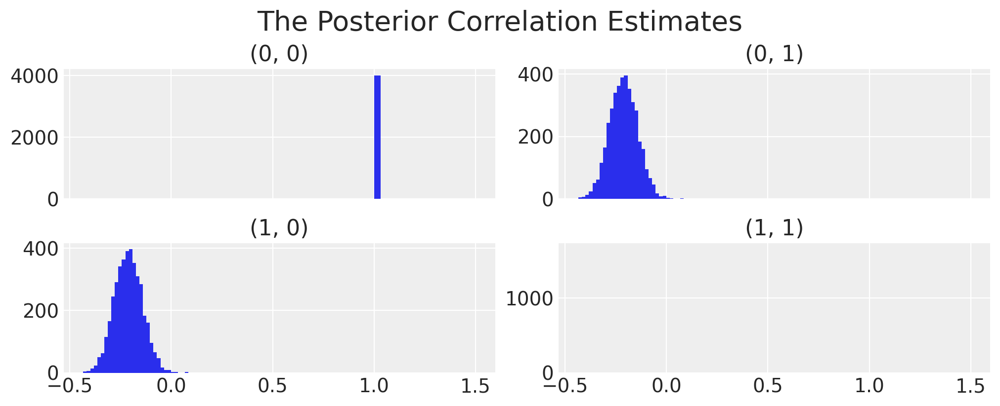

In [1073]:
post_corr = (idata_fake_data['posterior']['noise_chol_corr'].to_dataframe().reset_index()
.pivot(['chain', 'draw', 'noise_chol_corr_dim_0'], 'noise_chol_corr_dim_1', 'noise_chol_corr').reset_index()
.pivot(['chain', 'draw'], 'noise_chol_corr_dim_0'));
post_corr.columns = post_corr.columns.to_flat_index()
fig, axs = plt.subplots(2, 2, figsize=(10, 4), sharex=True)
axs = axs.flatten()
for ax, col in zip(axs, post_corr.columns):
    ax.hist(post_corr[col], bins=30)
    ax.set_title(col)
plt.suptitle("The Posterior Correlation Estimates", fontsize=20);


## Applying the Theory: Macro Economic Timeseries

In [1075]:
gdp_hierarchical = pd.read_csv('../data/gdp_data_hierarchical_clean.csv', index_col=0)
gdp_hierarchical

,country,iso2c,iso3c,year,GDP,CONS,GFCF,dl_gdp,dl_cons,dl_gfcf,more_than_10,time
1,Australia,AU,AUS,1971,4.647670e+11,3.113170e+11,7.985100e+10,0.039217,0.040606,0.031705,True,1
2,Australia,AU,AUS,1972,4.829350e+11,3.229650e+11,8.209200e+10,0.038346,0.036732,0.027678,True,2
3,Australia,AU,AUS,1973,4.955840e+11,3.371070e+11,8.460300e+10,0.025855,0.042856,0.030129,True,3
4,Australia,AU,AUS,1974,5.159300e+11,3.556010e+11,8.821400e+10,0.040234,0.053409,0.041796,True,4
5,Australia,AU,AUS,1975,5.228210e+11,3.759000e+11,8.255900e+10,0.013268,0.055514,-0.066252,True,5
...,...,...,...,...,...,...,...,...,...,...,...,...
366,United States,US,USA,2016,1.850960e+13,1.522497e+13,3.802207e+12,0.016537,0.023425,0.021058,True,44
367,United States,US,USA,2017,1.892712e+13,1.553075e+13,3.947418e+12,0.022306,0.019885,0.037480,True,45
368,United States,US,USA,2018,1.947957e+13,1.593427e+13,4.119951e+12,0.028771,0.025650,0.042780,True,46
369,United States,US,USA,2019,1.992544e+13,1.627888e+13,4.248643e+12,0.022631,0.021396,0.030758,True,47


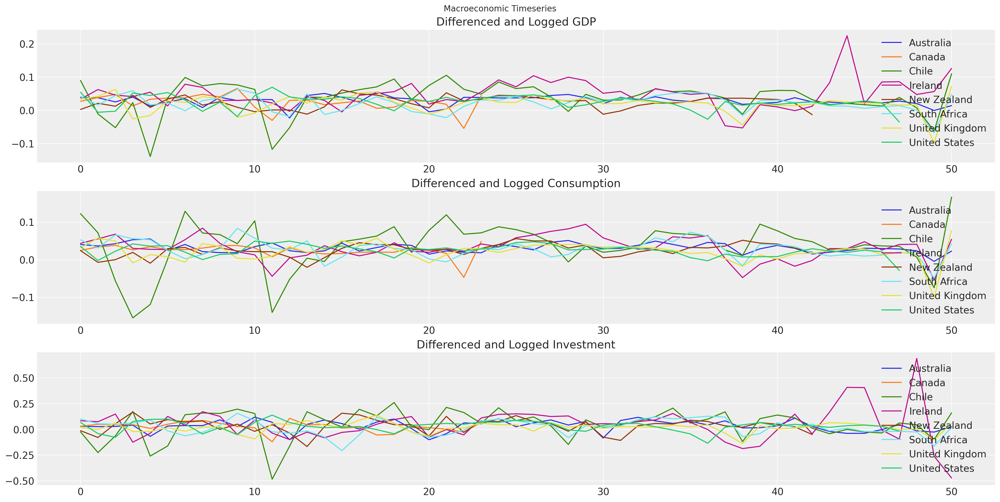

In [1081]:
fig, axs = plt.subplots(3, 1, figsize=(20, 10))
for country in gdp_hierarchical['country'].unique():
    temp = gdp_hierarchical[gdp_hierarchical['country']== country].reset_index()
    axs[0].plot(temp['dl_gdp'], label=f'{country}')
    axs[1].plot(temp['dl_cons'], label=f'{country}')
    axs[2].plot(temp['dl_gfcf'], label=f'{country}')
axs[0].set_title("Differenced and Logged GDP")
axs[1].set_title("Differenced and Logged Consumption")
axs[2].set_title("Differenced and Logged Investment")
axs[0].legend()
axs[1].legend()
axs[2].legend()
plt.suptitle("Macroeconomic Timeseries");

## Ireland's Economic Situation

Ireland is somewhat infamous for its GDP numbers that are largely the product of foreign direct investment and inflated beyond expectation in recent years by the investment and taxation deals offered to large multi-nationals. We'll look here at just the relationship between GDP and consumption. We just want to show the mechanics of the VAR estimation, you shouldn't read too much into the subsequent analysis. 

In [1082]:
ireland_df = gdp_hierarchical[gdp_hierarchical['country'] == 'Ireland']
ireland_df

,country,iso2c,iso3c,year,GDP,CONS,GFCF,dl_gdp,dl_cons,dl_gfcf,more_than_10,time
127,Ireland,IE,IRL,1971,3.314234e+10,2.897699e+10,8.317518e+09,0.034110,0.043898,0.085452,True,1
128,Ireland,IE,IRL,1972,3.529322e+10,3.063538e+10,8.967782e+09,0.062879,0.055654,0.075274,True,2
129,Ireland,IE,IRL,1973,3.695956e+10,3.280221e+10,1.041728e+10,0.046134,0.068340,0.149828,True,3
130,Ireland,IE,IRL,1974,3.853412e+10,3.381524e+10,9.207243e+09,0.041720,0.030416,-0.123476,True,4
131,Ireland,IE,IRL,1975,4.071386e+10,3.477232e+10,8.874887e+09,0.055024,0.027910,-0.036765,True,5
132,Ireland,IE,IRL,1976,4.128174e+10,3.573533e+10,1.007804e+10,0.013852,0.027318,0.127134,True,6
133,Ireland,IE,IRL,1977,4.467151e+10,3.770383e+10,1.048678e+10,0.078916,0.053622,0.039756,True,7
134,Ireland,IE,IRL,1978,4.788193e+10,4.102160e+10,1.246647e+10,0.069402,0.084337,0.172927,True,8
135,Ireland,IE,IRL,1979,4.935336e+10,4.285533e+10,1.416335e+10,0.030268,0.043731,0.127615,True,9
136,Ireland,IE,IRL,1980,5.087311e+10,4.377661e+10,1.349520e+10,0.030329,0.021270,-0.048324,True,10


In [1083]:
n_lags = 2
n_eqs = 2
model, idata_ireland = make_model(n_lags, n_eqs, ireland_df[['dl_gdp', 'dl_cons']], prior_checks=False)
idata_ireland

Sampling: [alpha, lag_coefs, noise_chol, obs]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [lag_coefs, alpha, noise_chol]
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 162 seconds.
Sampling: [obs]


Inference data with groups:
	> posterior
	> posterior_predictive
	> log_likelihood
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data

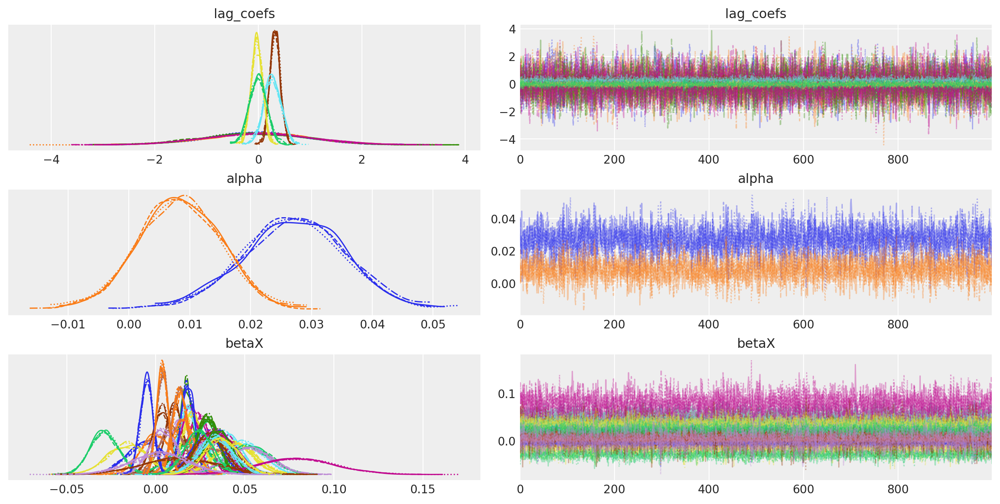

In [1087]:
az.plot_trace(idata_ireland, var_names=['lag_coefs', 'alpha', 'betaX']);

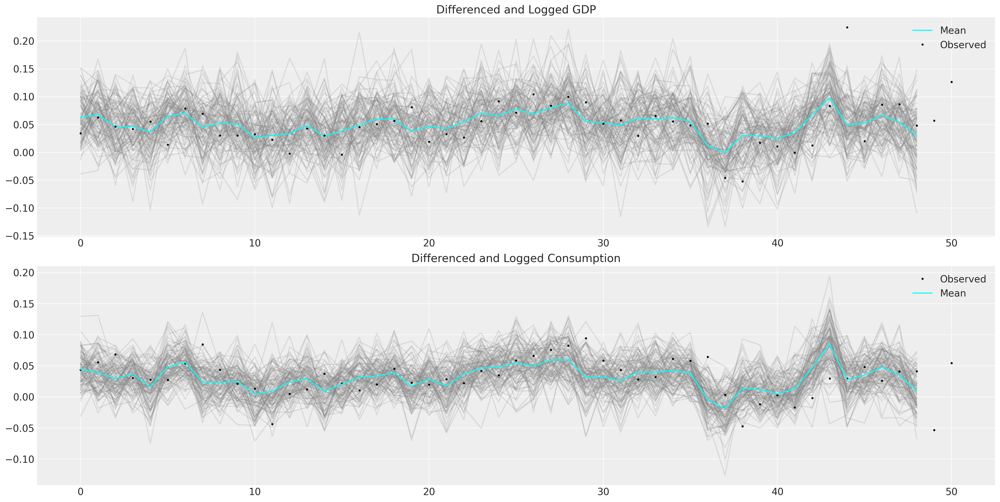

In [1089]:
def plot_ppc_macro(idata, df, group='posterior_predictive'):
    fig, axs = plt.subplots(2, 1, figsize=(20, 10))
    axs = axs.flatten()
    ppc = az.extract_dataset(idata, group=group, num_samples=100)["obs"]

    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color='grey', alpha=0.2);
    axs[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color='cyan', label='Mean');
    axs[0].plot(df['dl_gdp'], 'o', color='black', markersize=2, label='Observed')
    axs[0].set_title("Differenced and Logged GDP")
    axs[0].legend()
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color='grey', alpha=0.2);
    axs[1].plot(df['dl_cons'], 'o', color='black', markersize=2, label='Observed')
    axs[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color='cyan', label='Mean');
    axs[1].set_title("Differenced and Logged Consumption")
    axs[1].legend()

plot_ppc_macro(idata_ireland, ireland_df.reset_index())

/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_73226/705795886.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  post_corr = (idata_ireland['posterior']['noise_chol_corr'].to_dataframe().reset_index()
/var/folders/99/gp2xl6x513s0tvl3cx79zf7m0000gn/T/ipykernel_73226/705795886.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  post_corr = (idata_ireland['posterior']['noise_chol_corr'].to_dataframe().reset_index()


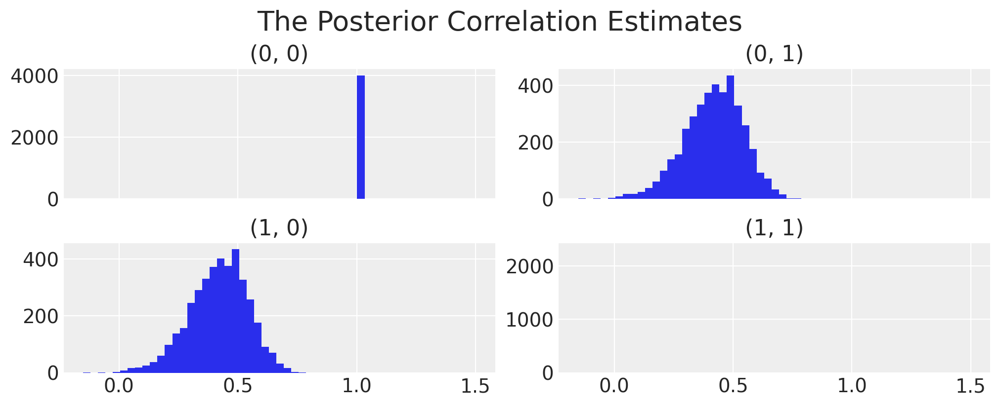

In [1090]:
post_corr = (idata_ireland['posterior']['noise_chol_corr'].to_dataframe().reset_index()
.pivot(['chain', 'draw', 'noise_chol_corr_dim_0'], 'noise_chol_corr_dim_1', 'noise_chol_corr').reset_index()
.pivot(['chain', 'draw'], 'noise_chol_corr_dim_0'));
post_corr.columns = post_corr.columns.to_flat_index()
fig, axs = plt.subplots(2, 2, figsize=(10, 4), sharex=True)
axs = axs.flatten()
for ax, col in zip(axs, post_corr.columns):
    ax.hist(post_corr[col], bins=30)
    ax.set_title(col)
plt.suptitle("The Posterior Correlation Estimates", fontsize=20);

### Comparison with Statsmodels


In [1092]:
VAR_model = VAR(ireland_df[['dl_gdp', 'dl_cons']])
results = VAR_model.fit(2)
results.summary()

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 06, Nov, 2022
Time:                     22:11:44
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -13.2566
Nobs:                     49.0000    HQIC:                  -13.4962
Log likelihood:           205.190    FPE:                1.19034e-06
AIC:                     -13.6427    Det(Omega_mle):     9.80111e-07
--------------------------------------------------------------------
Results for equation dl_gdp
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              0.034145         0.010913            3.129           0.002
L1.dl_gdp          0.324904         0.167362            1.941           0.052
L1.dl_cons         0.076629         0.275859            0.278          

In [1094]:
results.params

,dl_gdp,dl_cons
const,0.034145,0.006996
L1.dl_gdp,0.324904,0.330003
L1.dl_cons,0.076629,0.305824
L2.dl_gdp,0.137721,-0.053677
L2.dl_cons,-0.278745,0.033728


In [1093]:
az.summary(idata_ireland, var_names=['alpha', 'lag_coefs', 'noise_chol_corr'])

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha[dl_gdp],0.027,0.008,0.011,0.043,0.000,0.000,3647.0,3108.0,1.0
alpha[dl_cons],0.008,0.007,-0.005,0.021,0.000,0.000,3570.0,2790.0,1.0
"lag_coefs[dl_gdp, 1, dl_gdp]",-0.017,0.960,-2.002,1.679,0.013,0.019,5181.0,2022.0,1.0
"lag_coefs[dl_gdp, 1, dl_cons]",0.013,0.999,-1.796,2.005,0.015,0.017,4733.0,2658.0,1.0
"lag_coefs[dl_gdp, 2, dl_gdp]",-0.023,0.994,-1.865,1.805,0.014,0.017,4827.0,2824.0,1.0
"lag_coefs[dl_gdp, 2, dl_cons]",0.022,1.010,-1.749,1.981,0.014,0.017,5369.0,2930.0,1.0
"lag_coefs[dl_cons, 1, dl_gdp]",0.326,0.101,0.132,0.514,0.001,0.001,4691.0,3174.0,1.0
"lag_coefs[dl_cons, 1, dl_cons]",0.271,0.169,-0.049,0.588,0.003,0.002,4431.0,2844.0,1.0
"lag_coefs[dl_cons, 2, dl_gdp]",-0.026,0.113,-0.246,0.173,0.002,0.002,4935.0,2774.0,1.0
"lag_coefs[dl_cons, 2, dl_cons]",-0.006,0.169,-0.309,0.322,0.003,0.003,4273.0,3036.0,1.0


We can see here again how the Bayesian VAR model recovers much of the same story. Similar magnitudes in the estimates for the alpha terms for both equations and a clear relationship between the first lagged GDP numbers and consumption.

## Adding a Bayesian Twist: Hierarchical VARs

In addition we can add some hierarchical parameters if we want to model multiple countries and the relationship between these economic metrics at the national level. 

In [1017]:
def make_hierarchical_model(n_lags, n_eqs, df, group_field, mv_norm=True, prior_checks=True):
    cols = [col for col in df.columns if col != group_field]
    coords={"lags": np.arange(n_lags) + 1,
            "equations": cols,
            "cross_vars": cols}

    groups = df[group_field].unique()

    with pm.Model(coords=coords) as model:
        rho = pm.Beta('rho', alpha=1, beta=1);
        alpha_hat_location = pm.Normal('alpha_hat_location', 0, .1);
        alpha_hat_scale = pm.InverseGamma('alpha_hat_scale', 3, 0.5);
        beta_hat_location = pm.Normal('beta_hat_location', 0, .1);
        beta_hat_scale = pm.InverseGamma('beta_hat_scale', 3, 0.5);
        omega_global, _, _ = pm.LKJCholeskyCov('omega_global', n=n_eqs, eta=1.0, sd_dist=pm.Exponential.dist(1))
  
        
        for grp in groups:
            df_grp = df[df[group_field] == grp][cols]
            z_scale_beta = pm.InverseGamma(f'z_scale_beta_{grp}', 3, 0.5)
            z_scale_alpha = pm.InverseGamma(f'z_scale_alpha_{grp}', 3, 0.5)
            lag_coefs = pm.Normal(f'lag_coefs_{grp}', mu=beta_hat_location, sigma=beta_hat_scale*z_scale_beta, dims=["equations", "lags", "cross_vars"]) #filters x rows x columns
            alpha = pm.Normal(f'alpha_{grp}', mu=alpha_hat_location, sigma=alpha_hat_scale*z_scale_alpha, dims=("equations",))


            betaX = calc_ar_step(lag_coefs, n_eqs, n_lags, df_grp)
            betaX = pm.Deterministic(f'betaX_{grp}', betaX)
            mean = alpha + betaX

            if mv_norm:
                n = df_grp.shape[1]
                #noise_chol, _, _ = pm.LKJCholeskyCov(f'noise_chol_{grp}', eta=1.0, n=n, sd_dist=pm.Exponential.dist(1))
                #omega = pm.Deterministic(f'omega_{grp}', rho*omega_global + 1-rho*noise_chol)
                obs = pm.MvNormal(f'obs_{grp}', mu=mean, chol=omega_global, observed=df_grp.values[n_lags:])
            else:
                sigma = pm.HalfNormal(f'noise_{grp}', sigma=1.0, dims=['equations'])
                obs = pm.Normal(f'obs_{grp}', mu=mean, sigma=sigma, observed=df_grp.values[n_lags:])
                    
        if prior_checks:
            idata = pm.sample_prior_predictive()
            return model, idata
        else: 
            idata = pm.sample_prior_predictive()
            idata.extend(pm.sample(target_accept=0.99, random_seed=100))
            pm.sample_posterior_predictive(idata, extend_inferencedata=True)
    return model, idata



In [1018]:
model_full_test, idata_full_test = make_hierarchical_model(1, 3, gdp_hierarchical[gdp_hierarchical['country'].isin(['Ireland', 'Australia'])][['country', 'dl_gdp', 'dl_cons', 'dl_gfcf']], 'country', mv_norm=True, prior_checks=False)

Sampling: [alpha_Australia, alpha_Ireland, alpha_hat_location, alpha_hat_scale, beta_hat_location, beta_hat_scale, lag_coefs_Australia, lag_coefs_Ireland, noise_chol_Australia, noise_chol_Ireland, obs_Australia, obs_Ireland, omega_global, rho, z_scale_alpha_Australia, z_scale_alpha_Ireland, z_scale_beta_Australia, z_scale_beta_Ireland]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [rho, alpha_hat_location, alpha_hat_scale, beta_hat_location, beta_hat_scale, omega_global, z_scale_beta_Australia, z_scale_alpha_Australia, lag_coefs_Australia, alpha_Australia, noise_chol_Australia, z_scale_beta_Ireland, z_scale_alpha_Ireland, lag_coefs_Ireland, alpha_Ireland, noise_chol_Ireland]
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
WARNING (aesara.tensor.blas): Using NumPy C-API based imple

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 5103 seconds.
The acceptance probability does not match the target. It is 0.8692, but should be close to 0.99. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The acceptance probability does not match the target. It is 0.9602, but should be close to 0.99. Try to increase the number of tuning steps.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
The chain reached the maximum tree depth. Increase max_treedepth, increase target_accept or reparameterize.
Sampling: [obs_Australia, obs_Ireland]


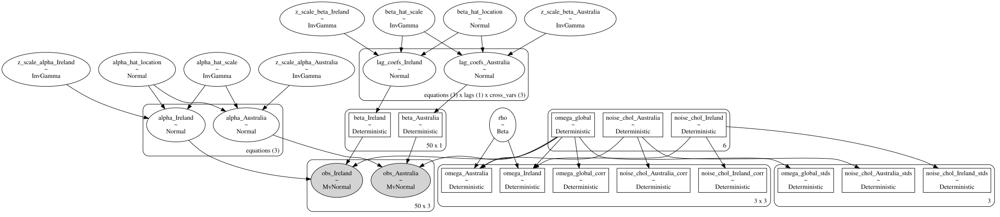

In [1019]:
pm.model_to_graphviz(model_full_test)

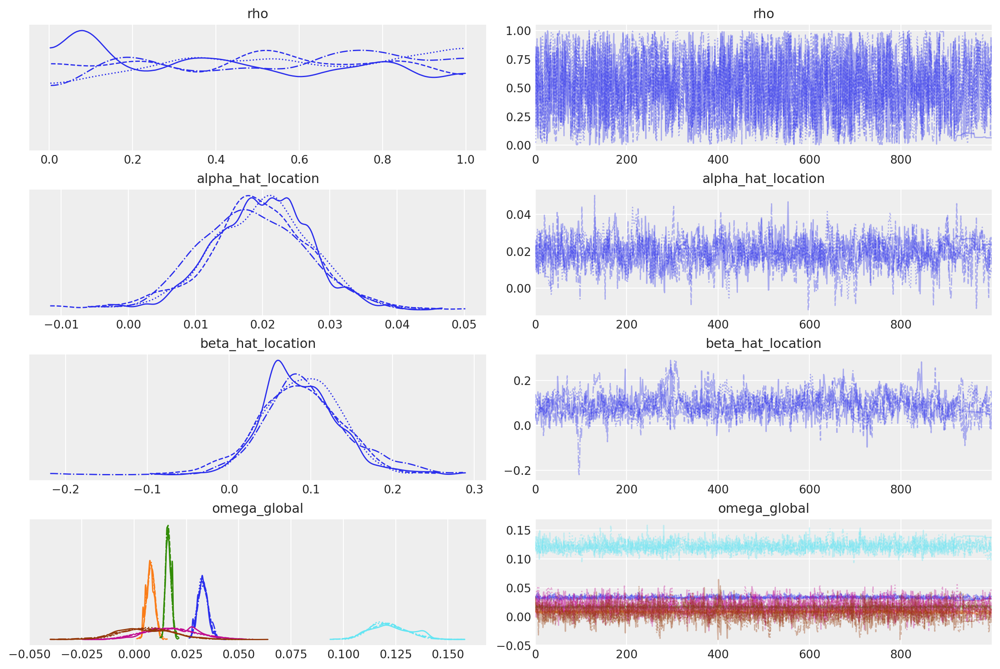

In [1020]:
az.plot_trace(idata_full_test, var_names=['rho', 'alpha_hat_location', 'beta_hat_location', 'omega_global']);

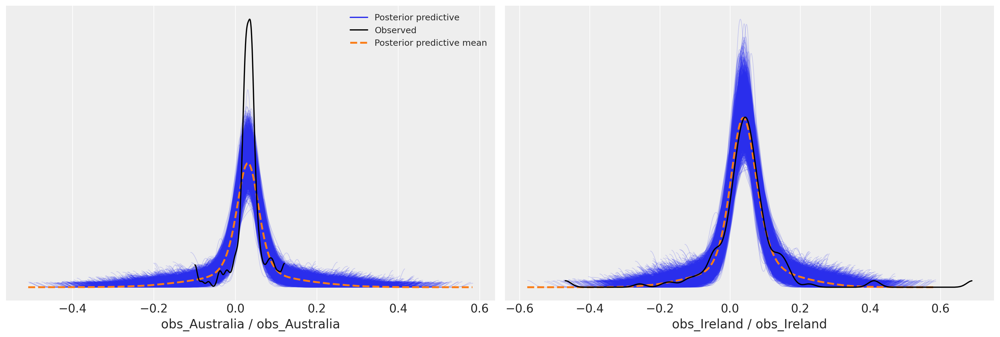

In [1021]:
az.plot_ppc(idata_full_test);

In [1022]:
az.summary(idata_full_test, var_names=['rho', 'alpha_hat_location', 'alpha_hat_scale', 'beta_hat_location', 'beta_hat_scale', 'omega_global_corr'])

/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
rho,0.504,0.287,0.056,0.982,0.009,0.006,949.0,1240.0,1.01
alpha_hat_location,0.019,0.008,0.005,0.033,0.000,0.000,544.0,1082.0,1.01
alpha_hat_scale,0.109,0.045,0.043,0.189,0.002,0.001,936.0,784.0,1.00
beta_hat_location,0.090,0.049,0.005,0.187,0.003,0.002,363.0,421.0,1.00
beta_hat_scale,0.414,0.259,0.086,0.868,0.014,0.010,277.0,964.0,1.02
"omega_global_corr[0, 0]",1.000,0.000,1.000,1.000,0.000,0.000,4000.0,4000.0,NaN
"omega_global_corr[0, 1]",0.432,0.091,0.269,0.607,0.005,0.004,309.0,377.0,1.01
"omega_global_corr[0, 2]",0.138,0.099,-0.040,0.323,0.003,0.002,1189.0,1625.0,1.00
"omega_global_corr[1, 0]",0.432,0.091,0.269,0.607,0.005,0.004,309.0,377.0,1.01
"omega_global_corr[1, 1]",1.000,0.000,1.000,1.000,0.000,0.000,3914.0,3552.0,1.00


In [1030]:
corr = pd.DataFrame(az.summary(idata_full_test, var_names=['omega_global_corr'])['mean'].values.reshape(3, 3), columns=['GDP', 'CONS', 'GFCF'])
corr.index = ['GDP', 'CONS', 'GFCF']
corr


/Users/nathanielforde/opt/miniconda3/envs/pymc_ar_ex/lib/python3.9/site-packages/arviz/stats/diagnostics.py:586: RuntimeWarning: invalid value encountered in double_scalars
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,GDP,CONS,GFCF
GDP,1.000,0.432,0.138
CONS,0.432,1.000,0.102
GFCF,0.138,0.102,1.000


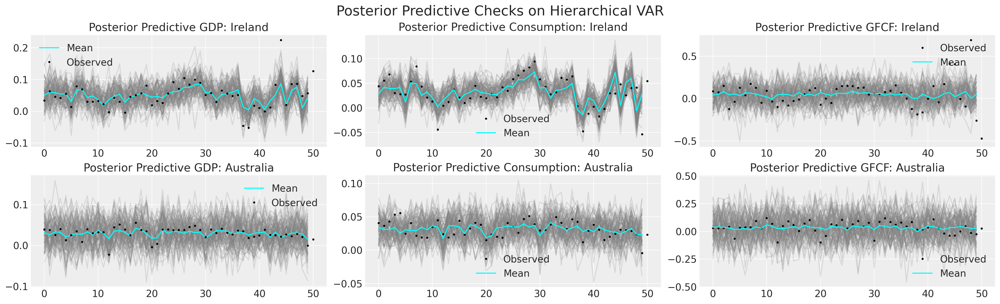

In [1096]:
countries = gdp_hierarchical['country'].unique()
countries = ['Ireland', 'Australia']
fig, axs = plt.subplots(2, 3, figsize=(20, 6))
for ax, country in zip(axs, countries):
    temp = gdp_hierarchical[gdp_hierarchical['country']== country].reset_index()
    ppc = az.extract_dataset(idata_full_test, group="posterior_predictive", num_samples=100)[f'obs_{country}']
    ax[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :], color='grey', alpha=0.2);
    ax[0].plot(np.arange(ppc.shape[0]), ppc[:, 0, :].mean(axis=1), color='cyan', label='Mean');
    ax[0].plot(temp['dl_gdp'], 'o', color='black', markersize=2, label='Observed')
    ax[0].set_title(f'Posterior Predictive GDP: {country}')
    ax[0].legend()
    ax[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :], color='grey', alpha=0.2);
    ax[1].plot(temp['dl_cons'], 'o', color='black', markersize=2, label='Observed')
    ax[1].plot(np.arange(ppc.shape[0]), ppc[:, 1, :].mean(axis=1), color='cyan', label='Mean');
    ax[1].set_title(f'Posterior Predictive Consumption: {country}')
    ax[1].legend()
    ax[2].plot(np.arange(ppc.shape[0]), ppc[:, 2, :], color='grey', alpha=0.2);
    ax[2].plot(temp['dl_gfcf'], 'o', color='black', markersize=2, label='Observed')
    ax[2].plot(np.arange(ppc.shape[0]), ppc[:, 2, :].mean(axis=1), color='cyan', label='Mean');
    ax[2].set_title(f'Posterior Predictive GFCF: {country}')
    ax[2].legend();
plt.suptitle("Posterior Predictive Checks on Hierarchical VAR", fontsize=20);


## Authors
* Adapted from PYMC labs [Blog](https://www.pymc-labs.io/blog-posts/bayesian-vector-autoregression/) by [Nathaniel Forde](https://nathanielf.github.io/) in October 2022, 2021 ([pymc-examples#456](https://github.com/pymc-devs/pymc-examples/pull/456))

In [1097]:
%load_ext watermark
%watermark -n -u -v -iv -w -p aesara,aeppl,xarray

Last updated: Sun Nov 06 2022

Python implementation: CPython
Python version       : 3.9.0
IPython version      : 8.4.0

aesara: 2.8.7
aeppl : 0.0.38
xarray: 2022.10.0

statsmodels: 0.13.2
pymc       : 4.2.2
numpy      : 1.23.4
pandas     : 1.5.1
sys        : 3.9.0 (default, Nov 15 2020, 06:25:35) 
[Clang 10.0.0 ]
aesara     : 2.8.7
arviz      : 0.12.1
matplotlib : 3.6.1

Watermark: 2.3.1



:::{include} ../page_footer.md
:::